# velocyto


In [ ]:
%%bash
path=/home/mssabirov/mstool/cellranger-7.0.0
samples=(K2_1_cellout_7000 K2_2_cellout_7000 K2_3_cellout K2_4_cellout K2_5_cellout K2_6_cellout Rat1_cellout Rat2_cellout Rat3_cellout Rat4_cellout Rat5_cellout Rat8_cellout)
gunzip mRatBN7.2_rmsk.gtf.gz

for sample in ${samples[@]}; do 
velocyto run10x -m mRatBN7.2_rmsk.gtf $path/${sample} genes.gtf --samtools-threads 24 --samtools-memory 18432 ; done




# loompy

объединение всех лумов в один


In [1]:
import glob

In [ ]:
paths = glob.glob("/home/mssabirov/mstool/cellranger-7.0.0/*cellout*/velocyto/*")

In [ ]:
paths

In [2]:
import loompy

In [ ]:
f'{os.getcwd()}/combined.loom'

In [ ]:
loompy.combine(files=paths, output_file=f'{os.getcwd()}/combined.loom', key="Accession")

# preprocessing and counting velocity

In [2]:
import scanpy as sc
import scvelo as scv
import numpy as np

In [4]:
adata = sc.read_h5ad('./ast.lastvar.h5ad')

In [5]:
ldata = scv.read('./combined.loom')

In [6]:
adata = scv.utils.merge(adata, ldata)

In [7]:
scv.pp.filter_and_normalize(adata)

Normalized count data: spliced, unspliced.


In [8]:
scv.pp.moments(adata)

computing neighbors
    finished (0:00:17) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:17) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [9]:
scv.tl.velocity(adata)

computing velocities
    finished (0:26:48) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [10]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/72 cores)


  0%|          | 0/26399 [00:00<?, ?cells/s]

    finished (0:00:46) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


# Project the velocities

In [11]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,genotype,sex,percent.mt,percent.hb,percent.rb,smpl,Barcode,...,integrated_snn_res.0.5,integrated_snn_res.0.7,integrated_snn_res.1,integrated_snn_res.0.85,sample_batch,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition
AAACCTGCAGTAGAGC,K2_1,16714.0,5968,tamed,mixed,2.722269,0.000000,0.915400,K2.1,AAACCTGCAGTAGAGC-1,...,6,9,2,10,K2.1_-1,9210,5609,9210.0,4762.381559,0.347285
AAACCTGTCCTAGAAC,K2_1,9391.0,3816,tamed,mixed,0.894473,0.000000,0.990310,K2.1,AAACCTGTCCTAGAAC-1,...,1,6,9,8,K2.1_-1,5018,3562,5018.0,3966.176815,0.213793
AAACGGGAGACAGACC,K2_1,10955.0,4490,tamed,mixed,0.739388,0.000000,0.994979,K2.1,AAACGGGAGACAGACC-1,...,5,6,1,1,K2.1_-1,5649,3839,5649.0,4327.297447,0.222012
AAACGGGAGTACGTTC,K2_1,2270.0,1295,tamed,mixed,3.964758,0.000000,1.938326,K2.1,AAACGGGAGTACGTTC-1,...,5,6,1,1,K2.1_-1,1746,132,1746.0,2491.447515,0.162988
AAACGGGCATATGGTC,K2_1,11863.0,4519,tamed,mixed,1.171710,0.016859,0.859816,K2.1,AAACGGGCATATGGTC-1,...,1,1,4,3,K2.1_-1,6301,4420,6301.0,4264.051354,0.243268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCACTCCTG,Rat8,4138.0,2198,tamed,male,1.304978,0.434993,1.594973,Rat8,TTTCCTCTCACTCCTG-1,...,1,1,4,3,Rat8_-1,1637,1981,1637.0,3290.453029,0.212979
TTTGCGCTCGCATGAT,Rat8,3233.0,1800,tamed,male,5.505722,0.278379,2.350758,Rat8,TTTGCGCTCGCATGAT-1,...,7,8,1,1,Rat8_-1,2016,676,2016.0,2939.423165,0.185709
TTTGGTTGTGATGATA,Rat8,4216.0,2322,tamed,male,2.727704,0.260911,0.948767,Rat8,TTTGGTTGTGATGATA-1,...,0,0,0,0,Rat8_-1,1870,1976,1870.0,3417.625457,0.162611
TTTGGTTTCAAGAAGT-1,Rat8,9702.0,4361,tamed,male,3.061224,0.123686,1.989281,Rat8,TTTGGTTTCAAGAAGT-1,...,9,11,13,13,Rat8_-1,737,672,737.0,4389.500672,0.335736


In [12]:
scv.set_figure_params()

In [ ]:
scv.pl.velocity_embedding(adata, basis = 'umap', color = 'integrated_snn_res.0.7')

In [ ]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = 'integrated_snn_res.0.7')

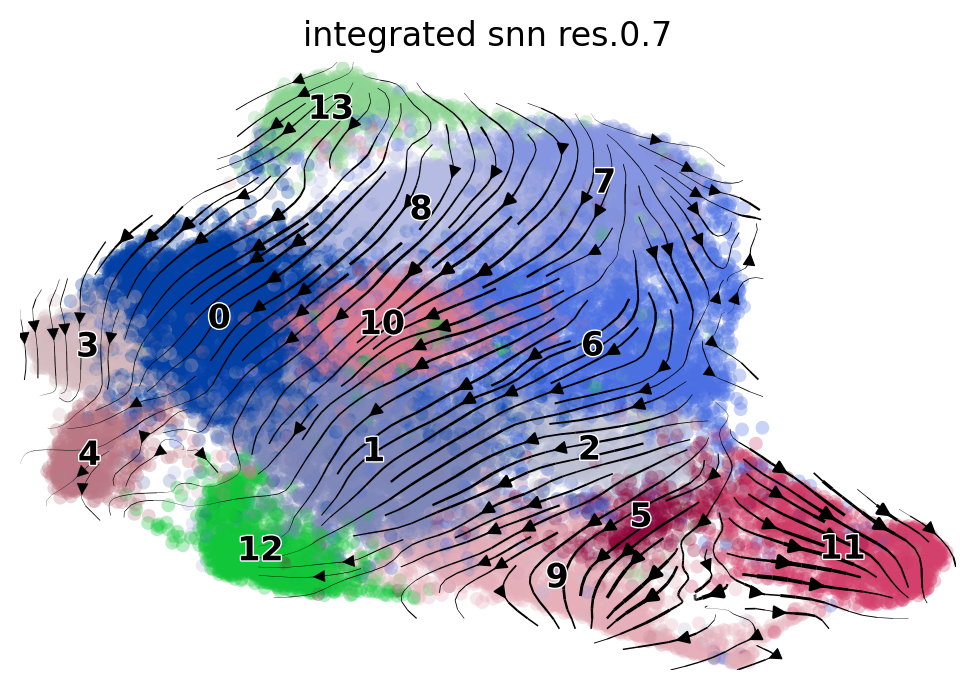

In [15]:
scv.pl.velocity_embedding_stream(adata, basis = 'umap', color = 'integrated_snn_res.0.7')

# higher velocity genes in each cluster

In [16]:
# very slow counting
scv.tl.rank_velocity_genes(adata, groupby = 'integrated_snn_res.0.7', min_corr=0.3)

ranking velocity genes
    finished (0:29:57) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [17]:
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

"""
надо сразу делать пандас, так будет проще дальше отрисовывать топ гены по каждому кластеру 
"""

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Psd2,Maob,Cadm2,Maob,Fos,Kcnb2,Mobp,Aqp4,Ptch1,Tenm4,Psd2,Kcnb2,Slc7a11,Aqp4
1,Maob,Slc7a11,Nebl,Psd2,Cadm2,Tnc,Serping1,S100b,Aifm3,Slit2,Aifm3,Caln1,Slit2,Nrp2
2,Luzp2,Slit2,Reln,Cadm2,Coq10b,Nebl,Prkag2,RGD1566401,Luzp2,Synpo2,Fosb,Chst9,Maob,Cadm2
3,Aifm3,Luzp2,Kcnb2,Bmpr1a,Fosb,Tenm4,Aqp4,Mobp,Psd2,Frem1,Flt1,Synpo2,Moxd1,Coq10b
4,Fosb,Moxd1,Synpo2,S100b,Bmpr1a,Maob,RGD1566401,Olr1,S100b,Nebl,LOC680227,Tenm4,Nebl,Ptch1


In [21]:
df.to_csv('rank_velocity_genes.csv', sep=',', encoding='utf-8')

In [29]:
top_velo_genes = df.head()

In [33]:
top_velo_genes

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Psd2,Maob,Cadm2,Maob,Fos,Kcnb2,Mobp,Aqp4,Ptch1,Tenm4,Psd2,Kcnb2,Slc7a11,Aqp4
1,Maob,Slc7a11,Nebl,Psd2,Cadm2,Tnc,Serping1,S100b,Aifm3,Slit2,Aifm3,Caln1,Slit2,Nrp2
2,Luzp2,Slit2,Reln,Cadm2,Coq10b,Nebl,Prkag2,RGD1566401,Luzp2,Synpo2,Fosb,Chst9,Maob,Cadm2
3,Aifm3,Luzp2,Kcnb2,Bmpr1a,Fosb,Tenm4,Aqp4,Mobp,Psd2,Frem1,Flt1,Synpo2,Moxd1,Coq10b
4,Fosb,Moxd1,Synpo2,S100b,Bmpr1a,Maob,RGD1566401,Olr1,S100b,Nebl,LOC680227,Tenm4,Nebl,Ptch1


In [48]:
import numpy as np

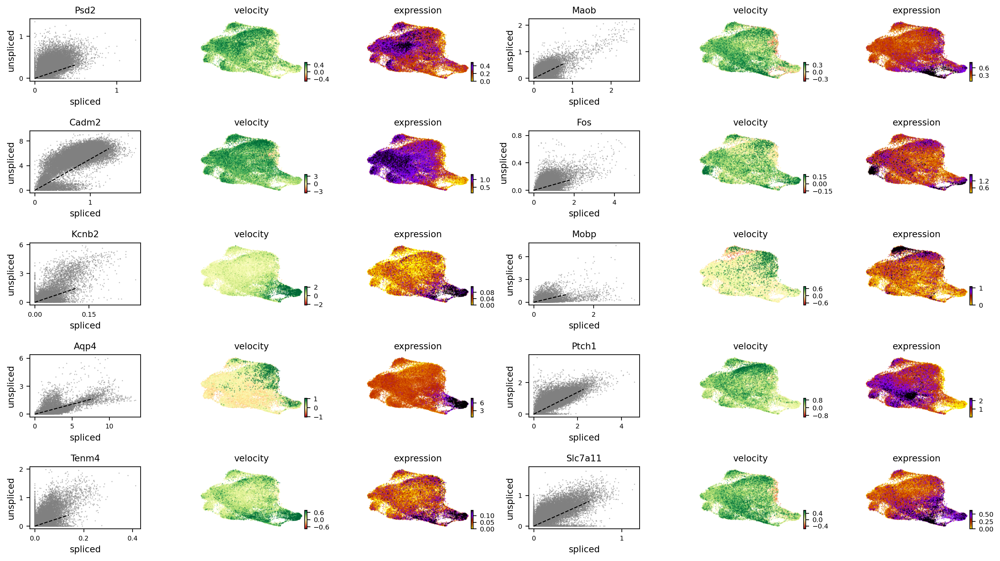

In [44]:
scv.pl.velocity(adata, list(df.iloc[0][1:]), ncols=2)

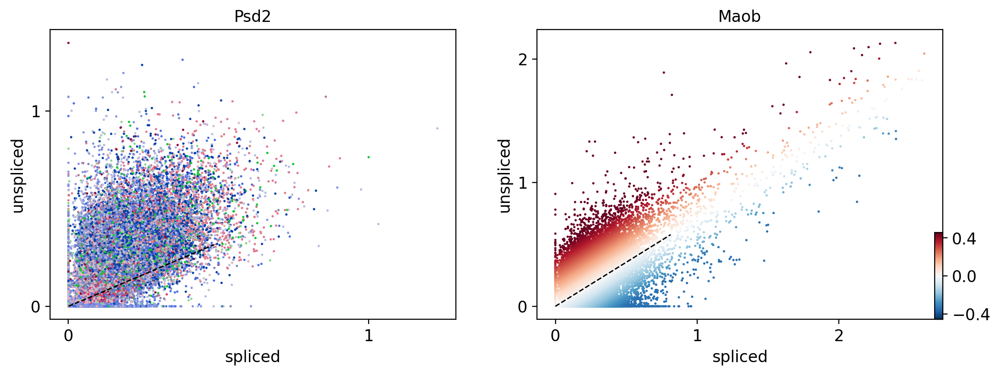

In [50]:
scv.pl.scatter(adata, list(df.iloc[0][1:]), color=['integrated_snn_res.0.7', 'velocity'])

# Velocity confedence and velocity length

velocity length - cells have higher velocity 

velocity confedence - kind of measure of the directionality of neighboring cells. If a bunch of cells close together are pointed in completely opposite directions it's going to have a lower velocity confedence then a bunch of cells which have a similar directions to their velocity

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


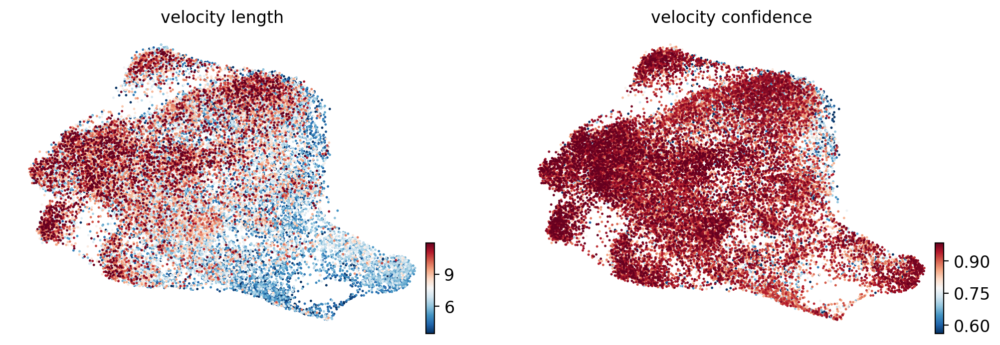

In [54]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c = keys, perc = [5,95])

In [55]:
df = adata.obs.groupby('integrated_snn_res.0.7')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

integrated_snn_res.0.7,0,1,2,3,4,5,6,7,8,9,10,11,12,13
velocity_length,7.810259,7.109869,6.026896,8.194281,9.466724,6.429435,7.047886,7.286433,7.295730,5.420226,7.954607,5.745306,7.655057,7.683092
velocity_confidence,0.876247,0.881894,0.844285,0.897664,0.932371,0.843571,0.839835,0.807780,0.809039,0.826250,0.883239,0.890567,0.893973,0.861692


# Velocity graph and pseudotime

## graph

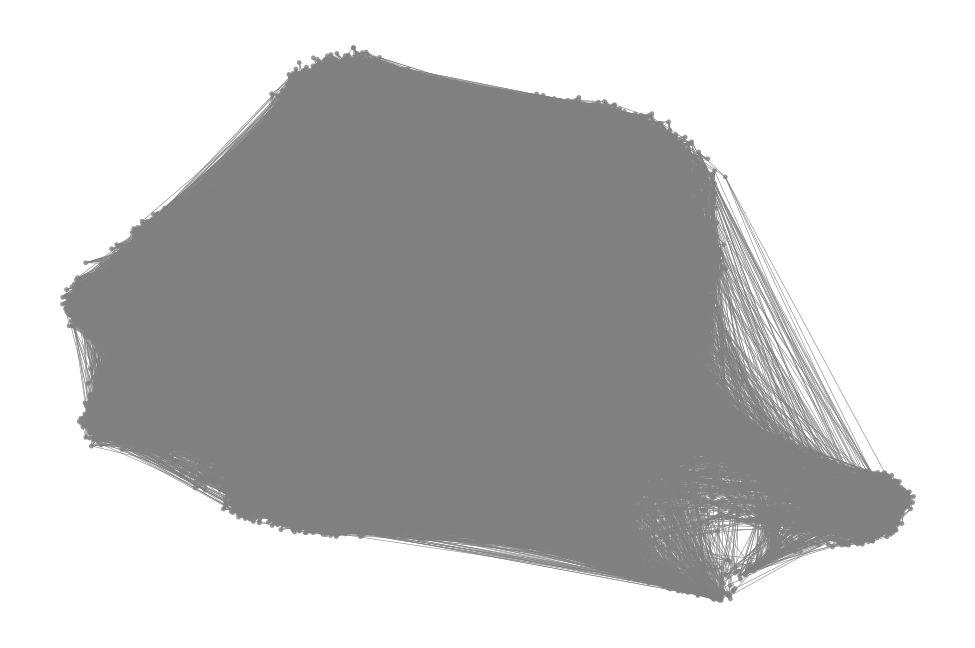

In [56]:
scv.pl.velocity_graph(adata, threshold=.1)

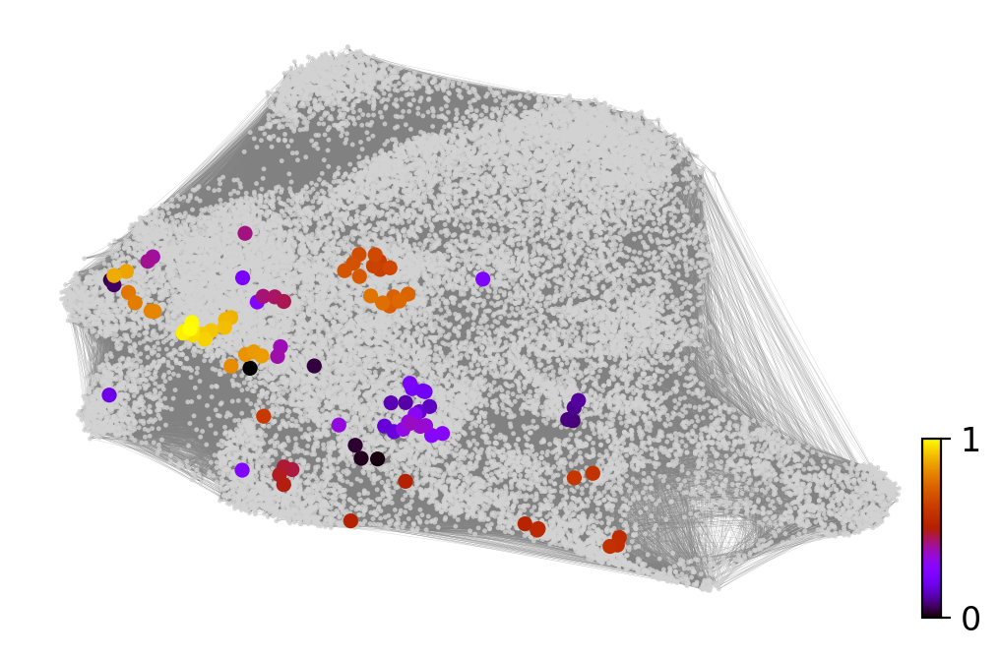

In [57]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

## pseudotime

computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:04) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


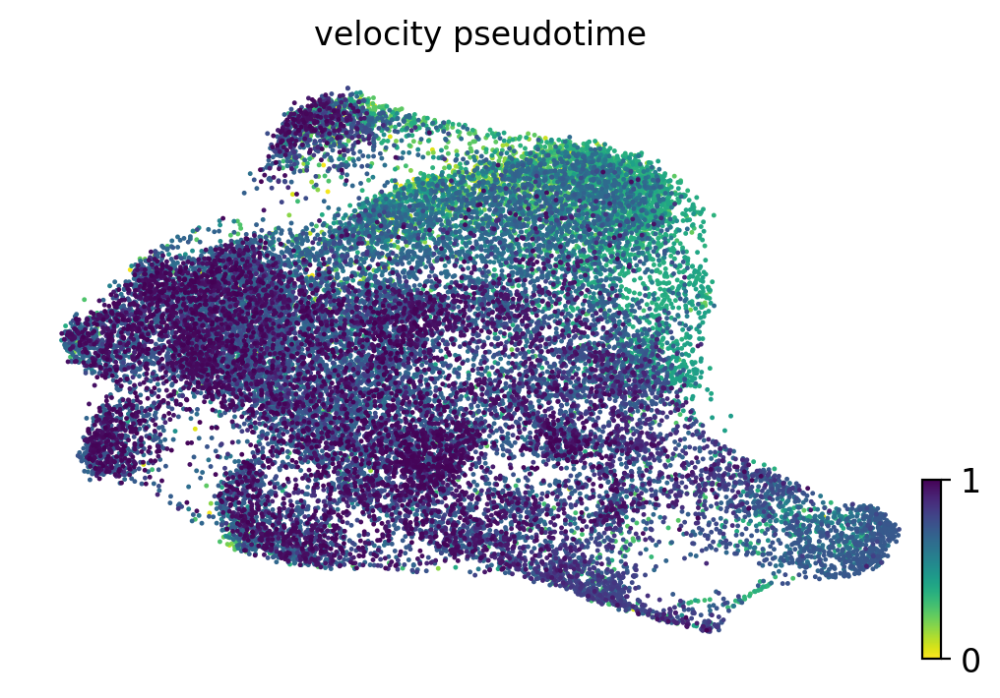

In [58]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color = 'velocity_pseudotime')

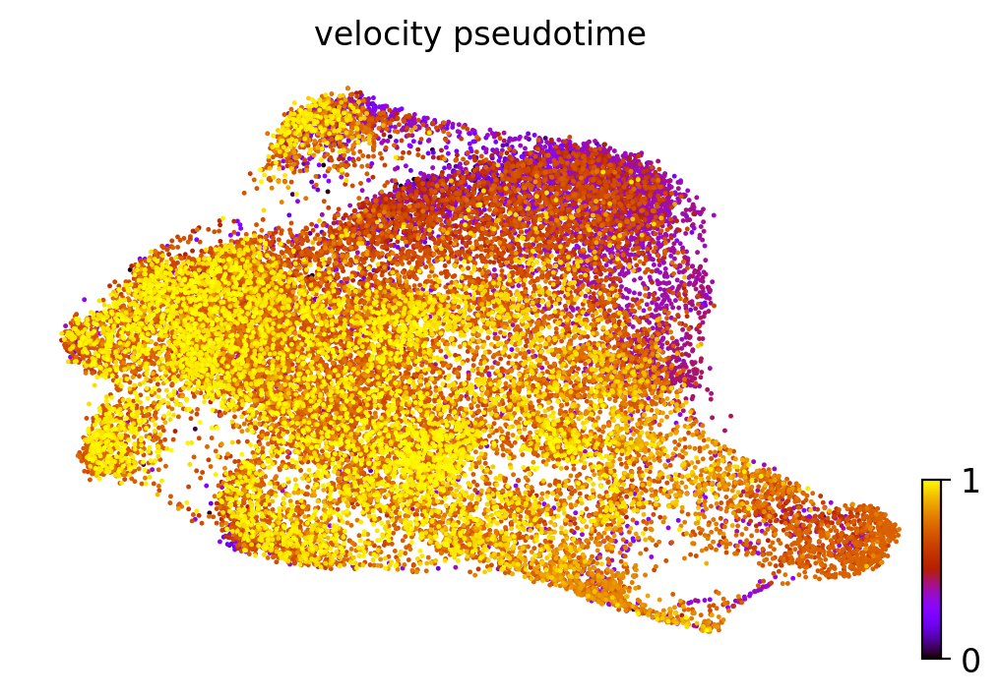

In [59]:
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

# using dynamical model for counting velocity 

recovering dynamics (using 36/72 cores)


  0%|          | 0/418 [00:00<?, ?gene/s]

    finished (0:43:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:12:49) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/72 cores)


  0%|          | 0/26399 [00:00<?, ?cells/s]

    finished (0:00:19) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:11) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


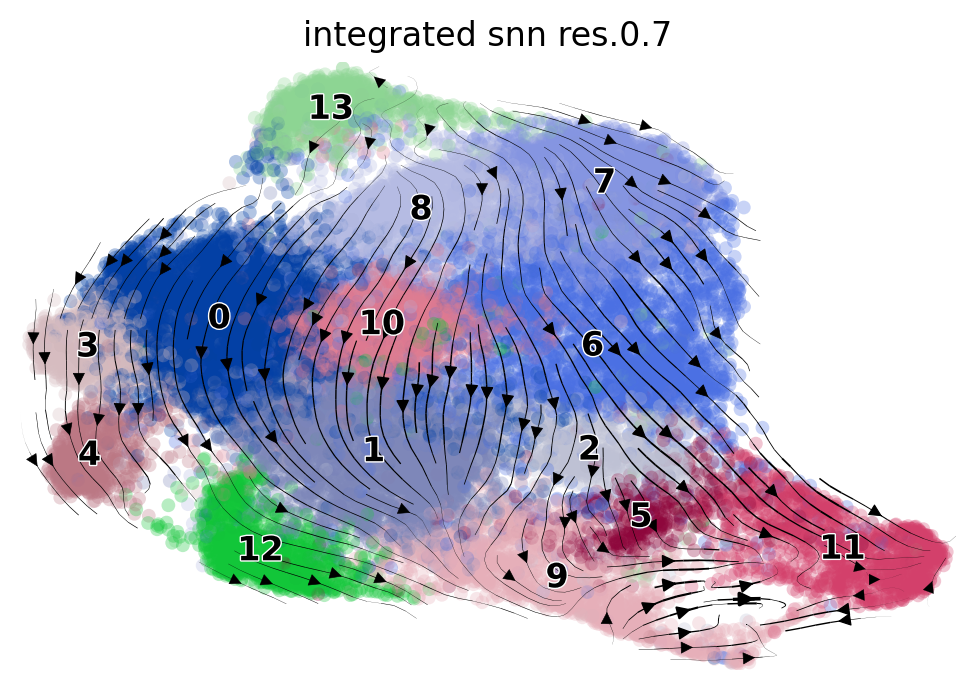

In [60]:
# change paraemters
scv.tl.recover_dynamics(adata, n_jobs = 36)
scv.tl.velocity(adata, mode = 'dynamical')
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, basis = 'umap', color = 'integrated_snn_res.0.7')

computing latent time using root_cells as prior
    finished (0:18:26) --> added 
    'latent_time', shared time (adata.obs)


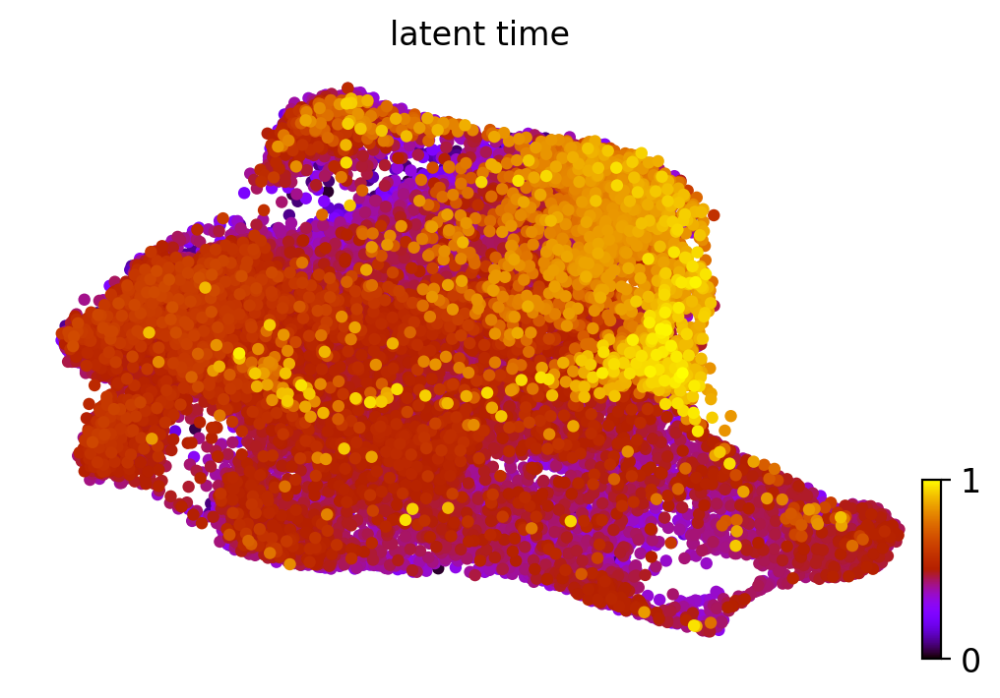

In [63]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color = 'latent_time', color_map = 'gnuplot', size = 80)

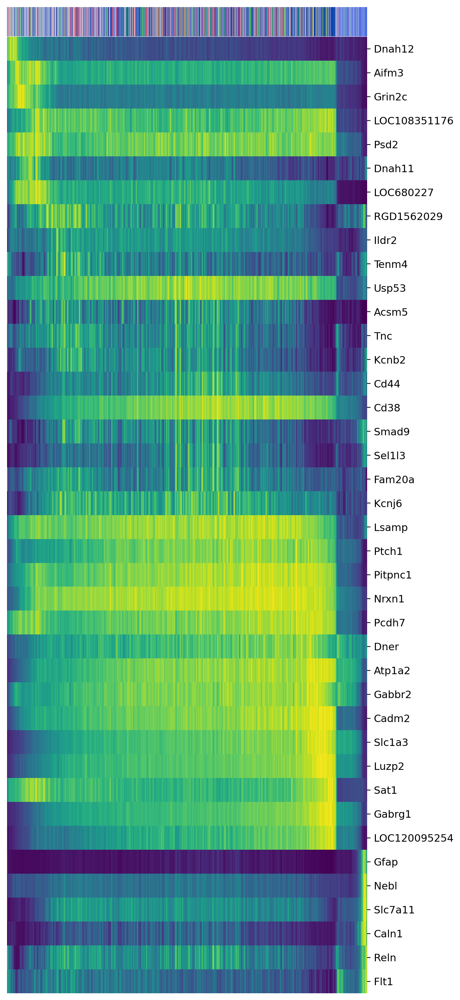

In [68]:
#тепловая карта экспрессий генов, расположенных вдоль линии латентного времени 
#Визуально можно выбрать гены, которые могут быть важны в переходе от одного клеточного состояния
#в другое

top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:40]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='integrated_snn_res.0.7', n_convolve=100, figsize=(7,15), colorbar = True)

In [70]:
adata.__dict__['_raw'].__dict__['_var'] = adata.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})

In [71]:
adata.write_h5ad('astro_velo.h5ad')

In [3]:
adata = sc.read_h5ad('./astro_velo.h5ad')

In [8]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:40]

In [9]:
top_genes

Index(['Slc1a3', 'Cadm2', 'Nrxn1', 'Lsamp', 'Ptch1', 'Gabrg1', 'Pcdh7',
       'Luzp2', 'Pitpnc1', 'Atp1a2', 'Slc7a11', 'Dnah11', 'Gabbr2', 'Usp53',
       'LOC108351176', 'Reln', 'LOC680227', 'Psd2', 'Tnc', 'Aifm3',
       'LOC120095254', 'Sel1l3', 'Kcnb2', 'Caln1', 'Dner', 'Cd38', 'Fam20a',
       'Sat1', 'Cd44', 'Ildr2', 'RGD1562029', 'Tenm4', 'Nebl', 'Acsm5', 'Gfap',
       'Grin2c', 'Smad9', 'Flt1', 'Dnah12', 'Kcnj6'],
      dtype='object')

In [10]:
top_velo_genes = ['Psd2','Maob', 'Cadm2', 'Maob', 'Fos', 'Kcnb2', 'Mobp', 'Aqp4', 'Ptch1','Tenm4', 'Psd2', 'Kcnb2', 'Slc7a11','Aqp4']

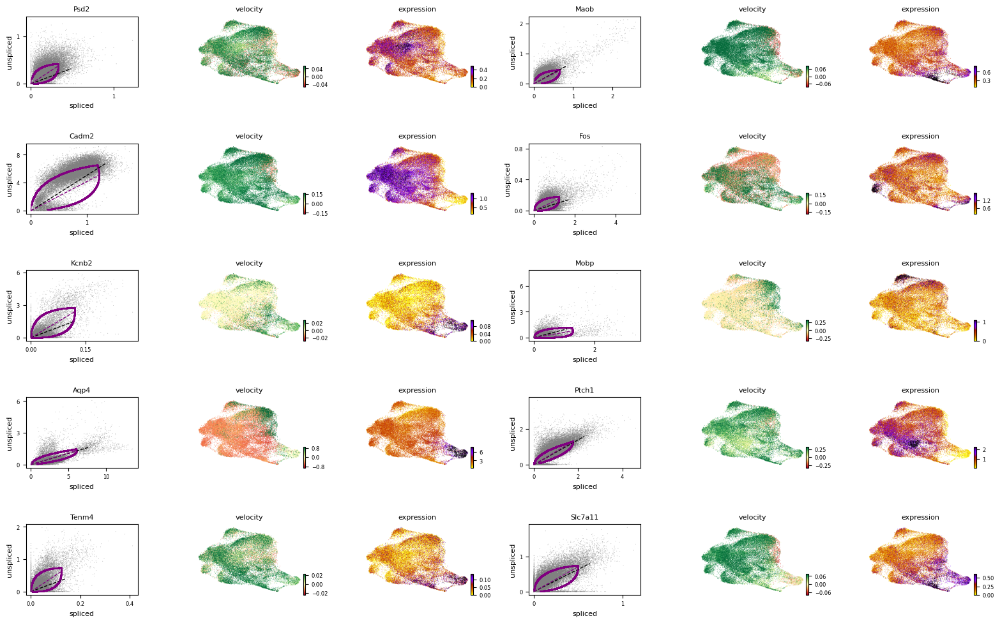

In [11]:
#визуализация значений велосити и значений экспрессии
#Если значение велосити большое, то экспрессия гена активировалась 
scv.pl.velocity(adata, top_velo_genes, ncols=2)

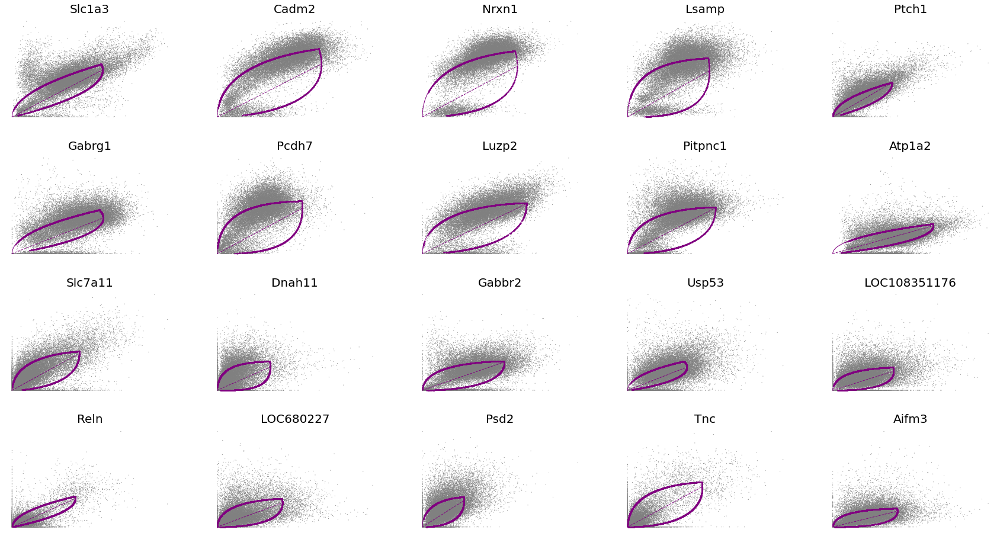

In [12]:
#отдельные графики велосити для разных генов
#если клеток, экспрессирующих ген мало, то получается какая-то фигня, поэтому, возможно, лучше
#смотреть только на гены, которые экспрессируются в достаточном числе клеток

#по оси y - число несплайсированных транскриптов
#по оси х - число сплайсированных транскриптов
#если график выше равновесной прямой, то значение велосити >0, ниже - <0. 
#top_genes = sample_filtered.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:20], ncols=5, frameon=False, fontsize=20)